Script Name: Seiz_Analysis 

Author: Fatemeh Delavari  
Version: 2.0 (08/07/2025)  
Description: Performs graph analysis on epileptic EEGs containing seizure

In [1]:
import mne
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import numpy as np
import os

In [2]:
simplified_names = [
    'FP1', 'FP2', 'F3', 'F4', 'C3', 'C4', 'P3', 'P4', 'O1', 'O2', 'F7', 'F8', 'T3', 'T4',
    'T5', 'T6', 'FZ', 'CZ', 'PZ'
]

# Define positions (in meters) for the channels
pos = {'FP1': (-0.03, 0.08, 0.05),
'FP2': (0.03, 0.08, 0.05),
'F3': (-0.04, 0.04, 0.06),
'F4': (0.04, 0.04, 0.06),
'C3': (-0.05, 0.00, 0.04),
'C4': (0.05, 0.00, 0.04),
'P3': (-0.04, -0.04, 0.03),
'P4': (0.04, -0.04, 0.03),
'O1': (-0.03, -0.08, 0.02),
'O2': (0.03, -0.08, 0.02),
'F7': (-0.07, 0.05, 0.06),
'F8': (0.07, 0.05, 0.06),
'T3': (-0.08, 0.00, 0.04),
'T4': (0.08, 0.00, 0.04),
'T5': (-0.06, -0.05, 0.03),
'T6': (0.06, -0.05, 0.03),
'FZ': (0.00, 0.03, 0.07),
'CZ': (0.00, 0.00, 0.06),
'PZ': (0.00, -0.03, 0.05)}

# Define the Butterworth filter parameters with filtfilt applied
iir_params = dict(order=6, ftype='butter', output='sos')

frequency_bands = {
    "Delta": [2, 4],
    "Theta": [4, 8],
    "Alpha": [8, 13],
    "Beta": [13, 30],
    "Gamma": [30, 40]
}

# List of target labels (case-insensitive)
target_labels = ['bckg', 'seiz', 'fnsz', 'gnsz', 'spsz', 'cpsz', 'absz', 
                 'tnsz', 'cnsz', 'tcsz', 'atsz', 'mysz', 'nesz']

# # List of target labels (case-insensitive)
# target_labels = ['gnsz']

In [3]:
# Specify the folder path containing the EDF files
folder_path = 'C:/Users/Atena/Documents/edf_files'
# Specify the folder path containing the CSV files
folder_path_csv = 'C:/Users/Atena/Documents/csv_files'

# Constants
num_channels = 19
epoch_length = 1  # in seconds
n_nodes = 19
# Parameters
extra_points = 120  # Extra points before and after seizure
num_intervals = 10  # Number of intervals for seizure portion
before_after_intervals = 2  # For before and after

electrodes = ['FP1', 'FP2', 'F7', 'F3', 'FZ', 'F4', 'F8', 'T3', 'C3', 'CZ', 'C4', 'T4', 'T5', 'P3', 'PZ', 'P4', 'T6', 'O1', 'O2']
electrode_locations = {
    'FP1': (-0.3, 0.8),
    'FP2': (0.3, 0.8),
    'F7': (-0.7, 0.5),
    'F3': (-0.4, 0.4),
    'FZ': (0.0, 0.3),
    'F4': (0.4, 0.4),
    'F8': (0.7, 0.5),
    'T3': (-0.8, 0),
    'C3': (-0.5, 0.0),
    'CZ': (0.0, 0.0),
    'C4': (0.5, 0.0),
    'T4': (0.8, 0),
    'T5': (-0.6, -0.5),
    'P3': (-0.4, -0.4),
    'PZ': (0.0, -0.3),
    'P4': (0.4, -0.4),
    'T6': (0.6, -0.5),
    'O1': (-0.3, -0.8),
    'O2': (0.3, -0.8)
    }
# Define the Butterworth filter parameters with filtfilt applied
iir_params = dict(order=6, ftype='butter', output='sos')

# Define the functions to be used
from scipy.signal import hilbert, butter, filtfilt
def bandpass_filter(data, sfreq, low_freq, high_freq):
    """
    Band-pass filter the data.
    
    Parameters:
    data (ndarray): The input signal of shape (n_channels, n_times)
    sfreq (float): The sampling frequency
    low_freq (float): The lower bound of the frequency range
    high_freq (float): The upper bound of the frequency range
    
    Returns:
    filtered_data (ndarray): The band-pass filtered signal
    """
    nyquist = 0.5 * sfreq
    low = low_freq / nyquist
    high = high_freq / nyquist
    b, a = butter(4, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data, axis=1)
    return filtered_data

In [4]:
def epoch_data(data, sfreq, epoch_length):
    n_channels, n_samples = data.shape
    epoch_samples = int(epoch_length * sfreq)
    n_epochs = n_samples // epoch_samples
    epochs = np.array_split(data[:, :n_epochs * epoch_samples], n_epochs, axis=1)
    return epochs, n_epochs

In [5]:
def bandpass_filter(data, sfreq, low_freq, high_freq):
    """
    Band-pass filter the data.
    
    Parameters:
    data (ndarray): The input signal of shape (n_channels, n_times)
    sfreq (float): The sampling frequency
    low_freq (float): The lower bound of the frequency range
    high_freq (float): The upper bound of the frequency range
    
    Returns:
    filtered_data (ndarray): The band-pass filtered signal
    """
    nyquist = 0.5 * sfreq
    low = low_freq / nyquist
    high = high_freq / nyquist
    b, a = butter(4, [low, high], btype='band')
    filtered_data = filtfilt(b, a, data, axis=1)
    return filtered_data

In [6]:
def calculate_plv(phasedata):
    """
    Calculate the Phase Locking Value (PLV) between pairs of EEG channels.
    
    Parameters:
    eeg_data (ndarray): EEG data of shape (n_channels, n_times)
    sfreq (float): Sampling frequency of the EEG data
    low_freq (float): Lower frequency bound for band-pass filter (default 8 Hz)
    high_freq (float): Upper frequency bound for band-pass filter (default 13 Hz)
    
    Returns:
    plv_matrix (ndarray): PLV matrix of shape (n_channels, n_channels)
    """
    n_channels, n_times = phasedata.shape
    plv_matrix = np.ones((n_channels, n_channels))
    plv_array = np.ones((round(n_channels*(n_channels - 1)/2)))
    
    k = 0
    # Calculate PLV
    for i in range(n_channels):
        for j in range(i + 1, n_channels):
            phase_diff = phasedata[i] - phasedata[j]
            plv = np.abs(np.sum(np.exp(1j * phase_diff)) / n_times)
            plv_matrix[i, j] = plv
            plv_matrix[j, i] = plv  # PLV is symmetric
            plv_array[k] = plv
            k = k + 1
    return plv_array, plv_matrix

In [7]:
# Helper function to create graph from PLV matrix
def create_graph(plv_matrix, ch_names):
    G = nx.Graph()
    for i, ch1 in enumerate(ch_names):
        for j, ch2 in enumerate(ch_names):
            if i < j:  # To avoid duplicate edges
                weight = plv_matrix[i, j]
                G.add_edge(ch1, ch2, weight=weight)
    return G

In [8]:
# Helper function to create graph from PLV matrix
def create_graph_bi(plv_matrix, ch_names):
    G = nx.Graph()
    for i, ch1 in enumerate(ch_names):
        for j, ch2 in enumerate(ch_names):
            if i < j:  # To avoid duplicate edges
                weight = plv_matrix[i, j]
                if weight == 1:
                    G.add_edge(ch1, ch2, weight=1)  # Binary edge
    return G

In [ ]:
file_num = -1
bckg_only = []
sz_containing = []
results = {}
all_results = {}
all_results_nonorm = {}
re = []

def feature_extract(graph):
    features = {}
    # Calculate graph density
    features['density'] = nx.density(graph)
    # Average Clustering Coefficient
    if graph.number_of_edges() > 0:
      features['avg_clustering'] = nx.average_clustering(graph)
    else:
      features['avg_clustering'] = 0 
    # # Modularity requires community detection, using the 'community' package from 'python-louvain'
    # # You may need to install it using: pip install python-louvain
    # import community.community_louvain as community_louvain
    # # Find communities using the Louvain method
    # if graph.number_of_edges() > 0:
    #     partition = community_louvain.best_partition(graph)
    #     features['modularity'] = community_louvain.modularity(partition, graph)
    # else:
    #     partition = {}  # An empty partition, or you can set this to another default value if necessary
    #     features['modularity'] = 0  # Or set to None, or any other default value
    return features

def feature_extract_w(graph):
    features_w = {}
    # features_w['characteristic_path_length'] = nx.average_shortest_path_length(graph, weight='weight')
        # Create a new graph with inverted weights
    inverted_graph = nx.Graph()
    for u, v, d in graph.edges(data=True):
        if d['weight'] != 0:  # Ensure the weight is non-zero to avoid division by zero
            inverted_graph.add_edge(u, v, weight=1.0 / d['weight'])
    # Calculate the characteristic path length using the inverted weights
    features_w['characteristic_path_length'] = nx.average_shortest_path_length(inverted_graph, weight='weight')
    return features_w

# Function to calculate average values over intervals
def calculate_interval_averages(data_segment, num_intervals):
    length = len(data_segment)
    interval_size = length // num_intervals
    averages = []
    
    for i in range(num_intervals):
        start_idx = i * interval_size
        end_idx = (i + 1) * interval_size if i < num_intervals - 1 else length
        interval_data = data_segment[start_idx:end_idx]
        averages.append(np.mean(interval_data))
    
    return averages

# Loop through all the EDF files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith('.edf'):  # Check if the file is an EDF file
        file_path = os.path.join(folder_path, file_name)
        
        file_num = file_num + 1
        print(file_num)

        # Strip the .edf extension and look for the corresponding .csv file
        base_name = os.path.splitext(file_name)[0]
        csv_file_name = base_name + '.csv'
                
        # Check if the corresponding CSV file exists
        if csv_file_name in os.listdir(folder_path_csv):
            csv_file_path = os.path.join(folder_path_csv, csv_file_name)
            # Read the CSV file
            df = pd.read_csv(csv_file_path, comment='#') 

            # Extract the unique labels from the 'label' column, ignoring case sensitivity
            unique_labels = df['label'].str.lower().unique()

            # Find matching labels (case-insensitive comparison)
            matching_labels = [label for label in unique_labels if label in target_labels]

            # Convert the label column to lowercase for case-insensitive matching
            df['label'] = df['label'].str.lower()

            # Filter the rows that match the target labels
            matching_df = df[df['label'].isin(target_labels)]

            # Check if any label contains 'sz'
            if any('sz' in label for label in unique_labels):
                sz_containing.append(file_num)
            
                # Read the EDF file
                raw = mne.io.read_raw_edf(file_path, preload=True)
                data, times = raw[:]
                sfreq = int(raw.info['sfreq'])
                chs = raw.ch_names
                # Extract the info from the original raw object to preserve metadata
                info = raw.info

                if any('REF' in channel for channel in chs):
                    selected_channels = ['EEG FP1-REF', 'EEG FP2-REF', 'EEG F7-REF', 'EEG F3-REF', 
                            'EEG FZ-REF', 'EEG F4-REF', 'EEG F8-REF', 'EEG T3-REF', 
                            'EEG C3-REF', 'EEG CZ-REF', 'EEG C4-REF', 'EEG T4-REF', 
                            'EEG T5-REF', 'EEG P3-REF', 'EEG PZ-REF', 'EEG P4-REF',
                            'EEG T6-REF', 'EEG O1-REF', 'EEG O2-REF']
                    montage_positions = {ch_name: np.array(pos[ch_name.replace('EEG ', '').replace('-REF', '')])
                            for ch_name in selected_channels}
                else:
                    selected_channels = ['EEG FP1-LE', 'EEG FP2-LE', 'EEG F7-LE', 'EEG F3-LE', 'EEG FZ-LE', 'EEG F4-LE', 'EEG F8-LE', 'EEG T3-LE', 'EEG C3-LE', 'EEG CZ-LE', 'EEG C4-LE', 'EEG T4-LE', 'EEG T5-LE', 'EEG P3-LE', 'EEG PZ-LE', 'EEG P4-LE', 'EEG T6-LE', 'EEG O1-LE', 'EEG O2-LE']

                raw_selected = raw.copy()
                
                skipped_files = []
                try:
                    # Select the specified channels
                    raw_selected = raw_selected.pick_channels(selected_channels)

                    # Filter the data
                    preprocEEG = raw_selected.copy()
                    # Band-pass filter the data using a 6th-order Butterworth filter with filtfilt applied
                    preprocEEG.filter(l_freq=1.0, h_freq=50, method='iir', iir_params=iir_params, phase='zero')
                    preprocEEG.set_eeg_reference(ref_channels='average')

                    eeg_data, times = preprocEEG[:]
                    epoch_samples = int(epoch_length * sfreq)
                    
                    results[file_num] = {}
                    freq_num = 0
                    for band, freq_range in frequency_bands.items():
                        freq_num = freq_num + 1
                        low_freq, high_freq = freq_range
                        # Band-pass filter the data in the specified frequency band
                        eeg_data_filtered = bandpass_filter(eeg_data, sfreq, low_freq, high_freq)
                        # Compute the analytic signal (Hilbert transform) to get the phase
                        analytic_signal = hilbert(eeg_data_filtered, axis=1)
                        phase_data = np.angle(analytic_signal)
                        phase_epochs, n_epochs  = epoch_data(phase_data[:19, :], sfreq, epoch_length)
                        plv_array = np.zeros((19*9, n_epochs, high_freq-low_freq+1))
                        plv_matrix = np.zeros((19, 19, n_epochs, high_freq-low_freq+1))

                        for freq in range(low_freq, high_freq+1):
                            freq_n = freq-low_freq
                            # Band-pass filter the data in the specified frequency band
                            eeg_data_filtered = bandpass_filter(eeg_data, sfreq, freq-1, freq+1)
                            # Compute the analytic signal (Hilbert transform) to get the phase
                            analytic_signal = hilbert(eeg_data_filtered, axis=1)
                            phase_data = np.angle(analytic_signal)
                            phase_epochs, n_epochs = epoch_data(phase_data, sfreq, epoch_length)
                            epoch_n = 0
                            for epoch in phase_epochs:
                                plv_array[:, epoch_n, freq_n], plv_matrix[:, :, epoch_n, freq_n] = calculate_plv(epoch)
                                epoch_n = epoch_n + 1
                        plv_all = np.mean(plv_array, axis = 2)
                        plv_all_matrix = np.mean(plv_matrix, axis = 3)

                        graphs = []
                        epoch_n = 0
                        for epoch in phase_epochs:
                            graph = create_graph(plv_all_matrix[:, :, epoch_n], selected_channels)
                            graphs.append(graph)
                            epoch_n = epoch_n + 1

                        plv_bi = (plv_all>0.5).astype(int)

                        ratio_edge = np.sum(plv_bi)/plv_bi.size
                        print('Ratio Edges =', ratio_edge)
                        re.append(ratio_edge)
                        
                        plv_bi_matrix = (plv_all_matrix>0.5).astype(int)
                        graphs_bi = []
                        epoch_n = 0
                        for epoch in phase_epochs:
                            graph = create_graph_bi(plv_bi_matrix[:, :, epoch_n], selected_channels)
                            graphs_bi.append(graph)
                            epoch_n = epoch_n + 1

                        features_ = [feature_extract(G) for G in graphs_bi]
                        features_w = [feature_extract_w(G) for G in graphs]
                    
                        # List of general feature names
                        feature_names_ = ['density', 'avg_clustering']
                        feature_names_w = ['characteristic_path_length']
                        feature_names_A = ['density', 'avg_clustering', 'characteristic_path_length']

                        # Initialize a nested dictionary for the current band
                        results[file_num][band] = {feature: [] for feature in feature_names_ + feature_names_w}

                        # Collect each feature into the corresponding lists from unweighted graphs
                        for features in features_:
                            for feature in feature_names_:
                                results[file_num][band][feature].append(features[feature])

                        # Collect each feature into the corresponding lists from weighted graphs
                        for features in features_w:
                            for feature in feature_names_w:
                                results[file_num][band][feature].append(features[feature])

                        # Initialize dictionaries for each label
                        label_dictionaries = {}
                        for label in target_labels:
                            label_data = matching_df[matching_df['label'] == label]

                            # Special condition for 'bckg': keep only the largest start_time for similar stop_time
                            if label == 'bckg':
                                # Group by 'stop_time' and keep the row with the largest 'start_time' for each stop time
                                label_data = label_data.loc[label_data.groupby('stop_time')['start_time'].idxmax()]
                                # Group by 'start_time' and keep the row with the smallest 'stop_time' for each start time
                                label_data = label_data.loc[label_data.groupby('start_time')['stop_time'].idxmin()]

                            # Special condition for labels containing 'sz': keep the largest stop_time for similar start_time
                            if 'sz' in label:
                                # Group by 'start_time' and keep the row with the largest 'stop_time' for each start time
                                label_data = label_data.loc[label_data.groupby('start_time')['stop_time'].idxmax()]
                                # Group by 'stop_time' and keep the row with the smallest 'start_time' for each stop time
                                label_data = label_data.loc[label_data.groupby('stop_time')['start_time'].idxmin()]

                            # Extract unique (start, stop) pairs as tuples and ensure uniqueness
                            unique_pairs = sorted(set(zip(label_data['start_time'], label_data['stop_time'])))
    
                            # Store the pairs in the dictionary
                            label_dictionaries[f'{label}_start_stop_pairs'] = unique_pairs

                        for feature in feature_names_A:    
                            data = results[file_num][band][feature]    
                            # Process each seizure type in the dictionary
                            for seizure_type, start_stop_pairs in label_dictionaries.items():
                                if not start_stop_pairs:  # Skip if there are no start-stop pairs for this seizure type
                                    continue
                                if 'sz' in seizure_type:
                                    # Initialize an array to store the results of size (num_seizures, 2 + num_intervals + 2)
                                    num_seizures = len(start_stop_pairs)
                                    result = np.zeros((num_seizures, 2 + num_intervals + 2))
                                    
                                    # Process each seizure pair for this seizure type
                                    for idx, (start, stop) in enumerate(start_stop_pairs):
                                        start_idx = int(start)
                                        stop_idx = int(stop)
                                        
                                        # Calculate indices for extra points before and after
                                        start_with_extra = max(start_idx - extra_points, 0)
                                        stop_with_extra = min(stop_idx + extra_points, len(data))
                                        
                                        # Extract the relevant segments
                                        before_data = data[start_with_extra:start_idx]
                                        sz_data = data[start_idx:stop_idx]
                                        after_data = data[stop_idx:stop_with_extra]
                                        
                                        # Calculate averages for before, seizure, and after
                                        before_avg = calculate_interval_averages(before_data, before_after_intervals)
                                        sz_avg = calculate_interval_averages(sz_data, num_intervals)
                                        after_avg = calculate_interval_averages(after_data, before_after_intervals)
                                        
                                        # Combine the results into one array for this seizure
                                        result[idx, :2] = before_avg
                                        result[idx, 2:2+num_intervals] = sz_avg
                                        result[idx, 2+num_intervals:] = after_avg 

                                    # Store the results in all_results, indexed by (recording_name, frequency_band, feature, seizure_type)
                                    all_results[(file_num, band, feature, seizure_type)] = (result - np.min(result))/(np.max(result) - np.min(result))   

                                    # Store the results in all_results, indexed by (recording_name, frequency_band, feature, seizure_type)
                                    all_results_nonorm[(file_num, band, feature, seizure_type)] = result
                                    
                except ValueError as e:
                    if 'Missing channels from ch_names' in str(e):
                        skipped_files.append(file_name)
                        print(f"Skipped file due to missing channels: {file_name}")
                    else:
                        raise

In [9]:
import pickle

with open('sz_result_0_1135.pkl', 'rb') as f:
    all_results1 = pickle.load(f)
with open('sz_resultnonorm_0_1135.pkl', 'rb') as f:
    all_results_nonorm1 = pickle.load(f)

In [11]:
np.unique([key[0] for key in all_results1.keys()])

array([   0,    1,    2,   12,   16,   27,   32,   52,   55,   56,   57,
         58,   59,   60,   61,   62,   75,   78,   80,   81,   82,   83,
         85,   97,  100,  104,  110,  111,  114,  115,  116,  117,  139,
        141,  142,  143,  144,  145,  147,  148,  149,  150,  151,  153,
        154,  155,  156,  195,  196,  200,  207,  209,  210,  211,  212,
        219,  225,  233,  236,  240,  241,  242,  243,  244,  246,  247,
        248,  249,  250,  251,  252,  253,  254,  255,  256,  257,  260,
        261,  262,  263,  264,  265,  266,  267,  268,  269,  270,  271,
        272,  274,  293,  329,  333,  336,  337,  338,  349,  350,  352,
        353,  370,  382,  383,  384,  397,  402,  405,  408,  409,  410,
        411,  415,  426,  427,  452,  457,  461,  464,  468,  478,  506,
        513,  514,  529,  591,  592,  593,  594,  595,  596,  597,  682,
        683,  685,  693,  694,  695,  696,  697,  698,  701,  703,  704,
        705,  706,  711,  720,  721,  722,  723,  7

In [12]:
np.unique([key[0] for key in all_results_nonorm1.keys()])

array([   0,    1,    2,   12,   16,   27,   32,   52,   55,   56,   57,
         58,   59,   60,   61,   62,   75,   78,   80,   81,   82,   83,
         85,   97,  100,  104,  110,  111,  114,  115,  116,  117,  139,
        141,  142,  143,  144,  145,  147,  148,  149,  150,  151,  153,
        154,  155,  156,  195,  196,  200,  207,  209,  210,  211,  212,
        219,  225,  233,  236,  240,  241,  242,  243,  244,  246,  247,
        248,  249,  250,  251,  252,  253,  254,  255,  256,  257,  260,
        261,  262,  263,  264,  265,  266,  267,  268,  269,  270,  271,
        272,  274,  293,  329,  333,  336,  337,  338,  349,  350,  352,
        353,  370,  382,  383,  384,  397,  402,  405,  408,  409,  410,
        411,  415,  426,  427,  452,  457,  461,  464,  468,  478,  506,
        513,  514,  529,  591,  592,  593,  594,  595,  596,  597,  682,
        683,  685,  693,  694,  695,  696,  697,  698,  701,  703,  704,
        705,  706,  711,  720,  721,  722,  723,  7

In [10]:
with open('sz_result_1136_551.pkl', 'rb') as f:
    all_results2 = pickle.load(f)
with open('sz_resultnonorm_1136_551.pkl', 'rb') as f:
    all_results_nonorm2 = pickle.load(f)

In [13]:
offset = 1136
all_results2 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results2.items()
}
all_results_nonorm2 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results_nonorm2.items()
}

In [14]:
np.unique([key[0] for key in all_results2.keys()])

array([1138, 1146, 1148, 1150, 1151, 1153, 1155, 1161, 1183, 1184, 1185,
       1186, 1187, 1188, 1189, 1190, 1191, 1193, 1194, 1195, 1196, 1205,
       1206, 1300, 1307, 1308, 1309, 1326, 1327, 1328, 1329, 1330, 1331,
       1332, 1333, 1338, 1339, 1340, 1341, 1342, 1343, 1346, 1369, 1391,
       1392, 1393, 1396, 1398, 1400, 1401, 1403, 1425, 1426, 1429, 1434,
       1443, 1465, 1473, 1476, 1542, 1547, 1549, 1559, 1591, 1592, 1603,
       1604, 1636, 1645, 1649, 1653, 1665, 1669, 1670, 1671, 1672, 1673,
       1674, 1675, 1676, 1677, 1678, 1679, 1680, 1681, 1682, 1683, 1688,
       1689])

In [15]:
with open('sz_result_1688_1388_1551.pkl', 'rb') as f:
    all_results3 = pickle.load(f)
with open('sz_resultnonorm_1688_1388_1551.pkl', 'rb') as f:
    all_results_nonorm3 = pickle.load(f)

In [16]:
offset = 1690
all_results3 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results3.items()
}
all_results_nonorm3 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results_nonorm3.items()
}

In [17]:
np.unique([key[0] for key in all_results3.keys()])

array([1691, 1692, 1693, 1694, 1695, 1713, 1737, 1738, 1739, 1741, 1742,
       1745, 1754, 1783, 1815, 1817, 1826, 1835, 1836, 1837, 1838, 1839,
       1842, 1847, 1848, 1849, 1851, 1852, 1853, 1884, 1885, 1886, 1892,
       1894, 1897, 1906, 1927, 1936, 1939, 1942, 1950, 1951, 1952, 1953,
       1954, 1957, 1963, 1977, 1978, 1979, 1980, 1982, 1983, 1984, 1985,
       2001, 2004, 2006, 2007, 2009, 2010, 2012, 2013, 2022, 2023, 2030,
       2032, 2033, 2034, 2035, 2038, 2040, 2041, 2045, 2046, 2047, 2048,
       2049, 2050, 2051, 2052, 2053, 2054, 2055, 2060, 2066, 2084, 2085,
       2086, 2087, 2088, 2094, 2103, 2104, 2105, 2106, 2107, 2108, 2111,
       2116, 2117, 2122, 2123, 2124, 2125, 2126, 2128, 2130, 2131, 2132,
       2155, 2156, 2158, 2203, 2208, 2212, 2217, 2218, 2219, 2220, 2221,
       2222, 2223, 2224, 2225, 2226, 2228, 2229, 2230, 2231, 2232, 2233,
       2234, 2235, 2236, 2237, 2238, 2239, 2261, 2262, 2264, 2266, 2267,
       2271, 2272, 2273, 2274, 2304, 2305, 2309, 23

In [18]:
with open('sz_result_3239_3891_3899.pkl', 'rb') as f:
    all_results4 = pickle.load(f)
with open('sz_resultnonorm_3239_3891_3899.pkl', 'rb') as f:
    all_results_nonorm4 = pickle.load(f)

In [19]:
offset = 3242
all_results4 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results4.items()
}
all_results_nonorm4 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results_nonorm4.items()
}

In [20]:
np.unique([key[0] for key in all_results4.keys()])

array([3242, 3252, 3253, 3278, 3292, 3307, 3308, 3311, 3317, 3318, 3319,
       3320, 3321, 3322, 3323, 3324, 3335, 3341, 3399, 3400, 3402, 3403,
       3405, 3406, 3407, 3409, 3419, 3420, 3422, 3423, 3436, 3458, 3459,
       3464, 3465, 3466, 3470, 3472, 3473, 3474, 3475, 3476, 3477, 3478,
       3479, 3480, 3481, 3522, 3583, 3585, 3586, 3587, 3591, 3606, 3642,
       3643, 3644, 3659, 3660, 3706, 3718, 3719, 3732, 3734, 3735, 3737,
       3743, 3744, 3745, 3746, 3747, 3748, 3749, 3750, 3751, 3752, 3753,
       3754, 3755, 3756, 3757, 3758, 3759, 3760, 3761, 3762, 3763, 3767,
       3778, 3780, 3782, 3783, 3788, 3796, 3798, 3801, 3803, 3804, 3811,
       3812, 3813, 3814, 3817, 3831, 3841, 3842, 3855, 3864, 3865, 3866,
       3869, 3870, 3871, 3873, 3874, 3876, 3877, 3879, 3880, 3881, 3882,
       3883, 3884, 3886, 3887, 3902, 3905, 3929, 3949, 3952, 3956, 3964,
       4004, 4067, 4068, 4088, 4097, 4106, 4108, 4118, 4126, 4128, 4129,
       4131, 4145, 4171, 4174, 4236, 4261, 4263, 42

In [21]:
with open('sz_result_7139_.pkl', 'rb') as f:
    all_results5 = pickle.load(f)
with open('sz_resultnonorm_7139_.pkl', 'rb') as f:
    all_results_nonorm5 = pickle.load(f)

In [22]:
offset = 7139
all_results5 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results5.items()
}
all_results_nonorm5 = {
    (key[0] + offset, key[1], key[2], key[3]): value
    for key, value in all_results_nonorm5.items()
}

In [23]:
all_results = all_results1 | all_results2 | all_results3 | all_results4 | all_results5

In [30]:
all_results_nonorm = all_results_nonorm1 | all_results_nonorm2 | all_results_nonorm3 | all_results_nonorm4 | all_results_nonorm5

In [24]:
len(all_results.keys())

21318

In [25]:
len(all_results)

21318

In [26]:
all_results.keys()

dict_keys([(0, 'Delta', 'density', 'cpsz_start_stop_pairs'), (0, 'Delta', 'avg_clustering', 'cpsz_start_stop_pairs'), (0, 'Delta', 'characteristic_path_length', 'cpsz_start_stop_pairs'), (0, 'Theta', 'density', 'cpsz_start_stop_pairs'), (0, 'Theta', 'avg_clustering', 'cpsz_start_stop_pairs'), (0, 'Theta', 'characteristic_path_length', 'cpsz_start_stop_pairs'), (0, 'Alpha', 'density', 'cpsz_start_stop_pairs'), (0, 'Alpha', 'avg_clustering', 'cpsz_start_stop_pairs'), (0, 'Alpha', 'characteristic_path_length', 'cpsz_start_stop_pairs'), (0, 'Beta', 'density', 'cpsz_start_stop_pairs'), (0, 'Beta', 'avg_clustering', 'cpsz_start_stop_pairs'), (0, 'Beta', 'characteristic_path_length', 'cpsz_start_stop_pairs'), (0, 'Gamma', 'density', 'cpsz_start_stop_pairs'), (0, 'Gamma', 'avg_clustering', 'cpsz_start_stop_pairs'), (0, 'Gamma', 'characteristic_path_length', 'cpsz_start_stop_pairs'), (1, 'Delta', 'density', 'cpsz_start_stop_pairs'), (1, 'Delta', 'avg_clustering', 'cpsz_start_stop_pairs'), (1, '

In [ ]:
# import pickle 
# with open('sz_result_1136_551.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_1136_551.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)   

# import pickle 
# with open('sz_result_1688_1388_1551.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_1688_1388_1551.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)   

# import pickle 
# with open('sz_result_3239_3891_3899.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_3239_3891_3899.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)  

# import pickle 
# with open('sz_result_7139_.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_7139_.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)  

In [ ]:
# import pickle 
# with open('sz_result_0_1135.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_0_1135.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)   

In [ ]:
# import pickle 
# with open('sz_result_1136_551.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_1136_551.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)   

In [ ]:
# import pickle 
# with open('sz_result_1688_1388_1551.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_1688_1388_1551.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)   

In [ ]:
# import pickle 
# with open('sz_result_3239_3891_3899.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_3239_3891_3899.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)  

In [ ]:
# import pickle 
# with open('sz_result_7139_.pkl', 'wb') as f:
#     pickle.dump(all_results, f)
# with open('sz_resultnonorm_7139_.pkl', 'wb') as f:
#     pickle.dump(all_results_nonorm, f)  

In [10]:
1136+1+551

1688

In [13]:
file_name

'aaaaamnk_s001_t000.edf'

In [60]:
recording_names

array([  0,   1,   2,   4,   5,   7,  11,  12,  13,  17,  18,  23,  27,
        32,  33,  34,  36,  39,  40,  42,  71,  72,  74,  75,  76,  77,
        78,  79,  85,  86,  87,  98,  99, 100, 106, 110, 113, 114, 119,
       120, 122, 143, 175, 179, 184])

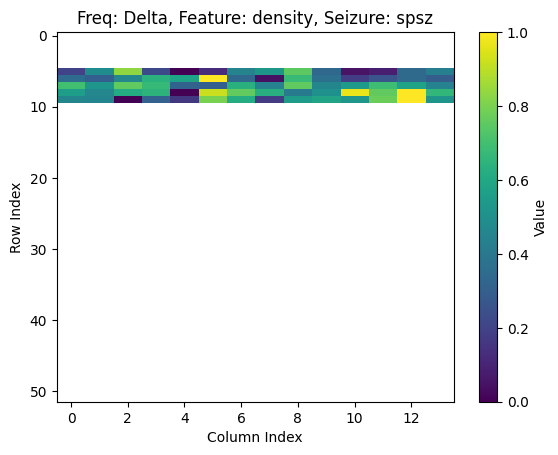

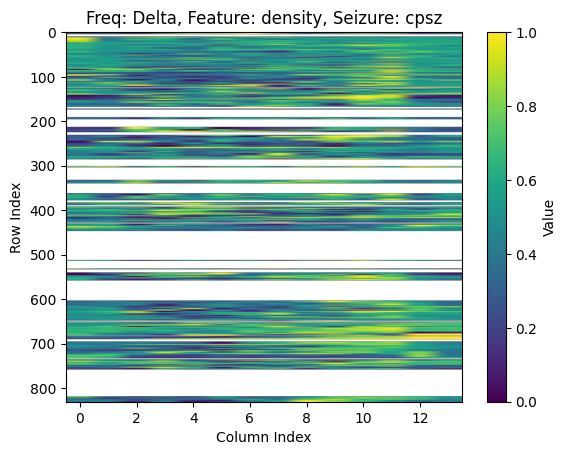

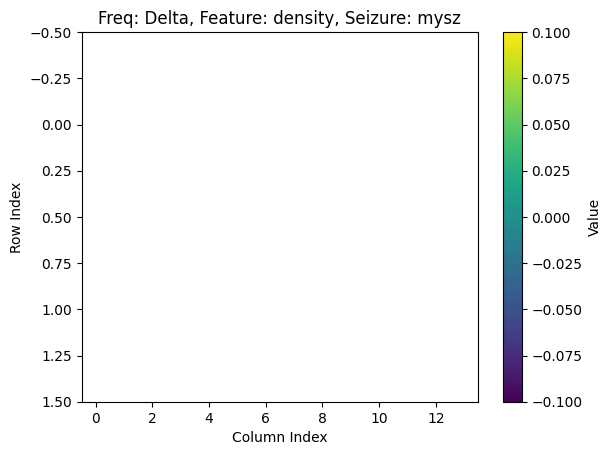

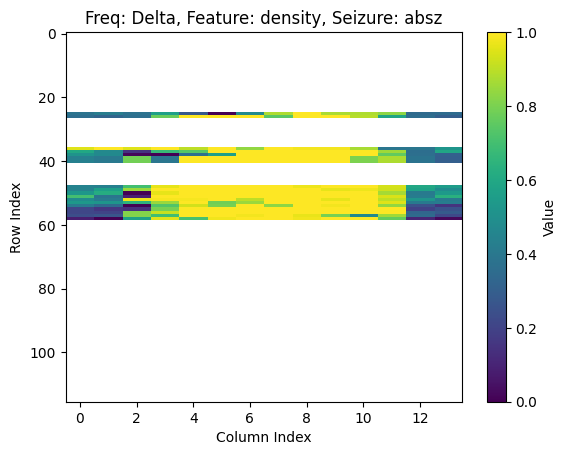

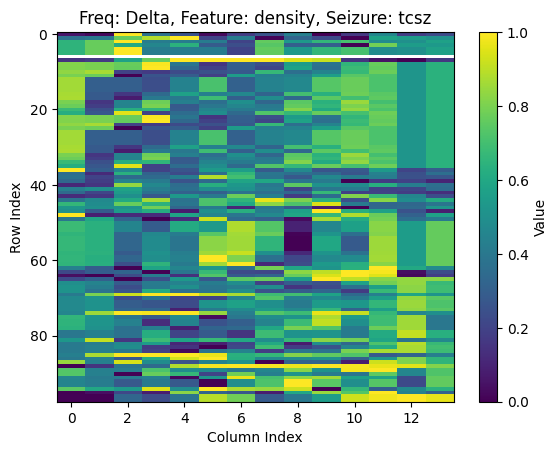

...

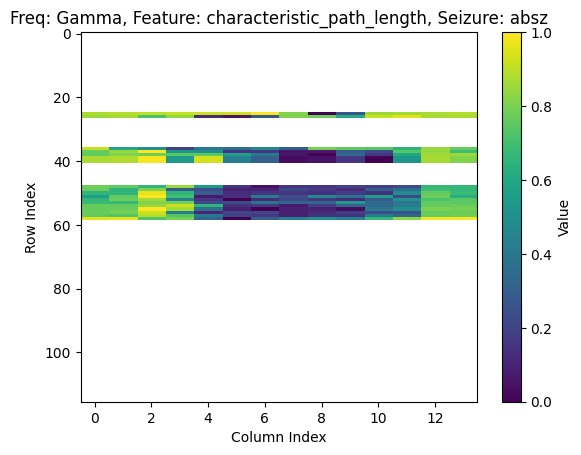

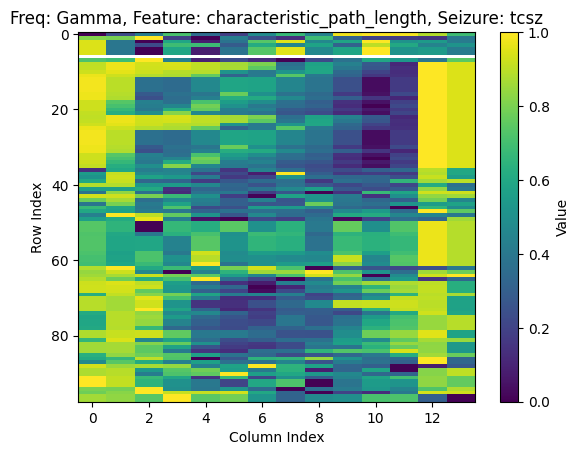

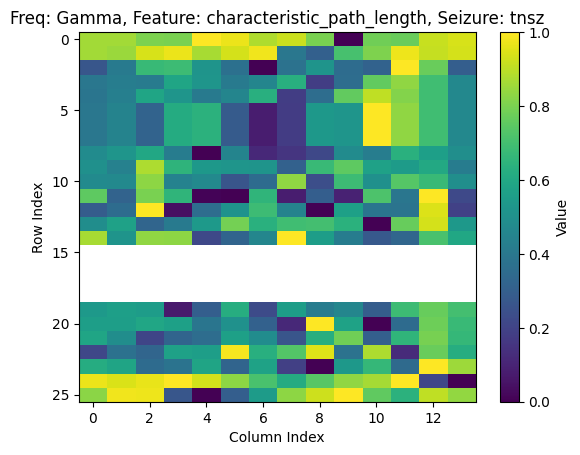

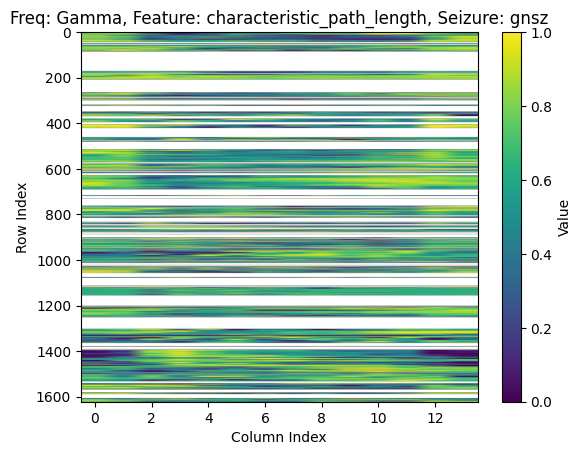

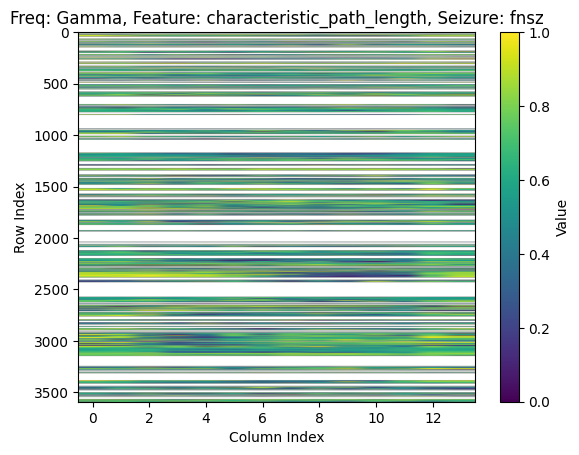

In [27]:
def get_seizure_types(all_results, recording_names):
    # Retrieve available seizure types across all recordings
    seizure_types = set()
    for recording in recording_names:
        for key in all_results.keys():
            if key[0] == recording:
                seizure_types.add(key[3])  # Add the seizure_type part of the key
    return list(seizure_types)

def plot_matrices_for_frequency_feature(all_results, recording_names, frequency_band, feature):
    # Retrieve available seizure types for these recordings
    seizure_types = get_seizure_types(all_results, recording_names)

    for seizure_type in seizure_types:
        seizure_t = seizure_type[:4]
        # Collect the matrices for each recording and concatenate them vertically
        concatenated_matrix = []
        for recording_name in recording_names:
            key = (recording_name, frequency_band, feature, seizure_type)
            if key in all_results:
                matrix = all_results[key]
                concatenated_matrix.append(matrix)

        if concatenated_matrix:  # Only plot if there are matrices available
            # Concatenate vertically to create a single matrix
            concatenated_matrix = np.vstack(concatenated_matrix)
            
            # Plot the matrix
            plt.imshow(concatenated_matrix, cmap='viridis', aspect='auto')
            plt.colorbar(label='Value')
            plt.title(f'Freq: {frequency_band}, Feature: {feature}, Seizure: {seizure_t}')
            plt.xlabel('Column Index')
            plt.ylabel('Row Index')
            plt.show()

# Example usage
freq_bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']  # frequency bands
features = ['density', 'avg_clustering', 'modularity', 'characteristic_path_length']  # features
recording_names= np.unique([key[0] for key in all_results.keys()])

# Loop over each frequency band and feature to generate the plots
for frequency_band in freq_bands:
    for feature in features:
        plot_matrices_for_frequency_feature(all_results, recording_names, frequency_band, feature)

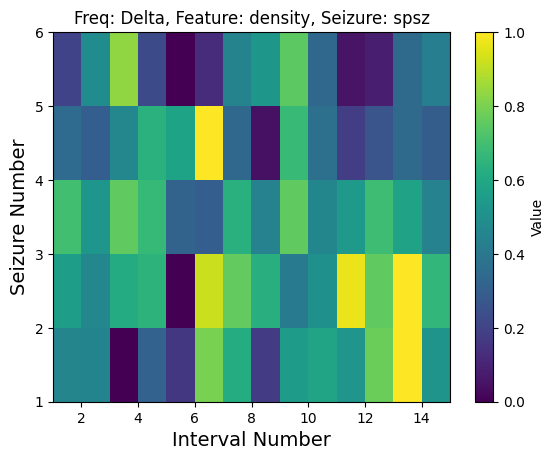

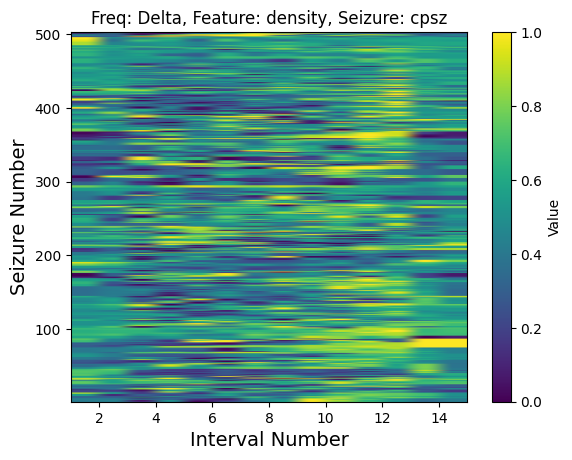

C:\Users\Atena\AppData\Local\Temp\ipykernel_25880\1004160275.py:31: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(vconcatenated_matrix_nonan, cmap='viridis', aspect='auto', extent=[1, vconcatenated_matrix_nonan.shape[1]+1, 1, vconcatenated_matrix_nonan.shape[0]+1])


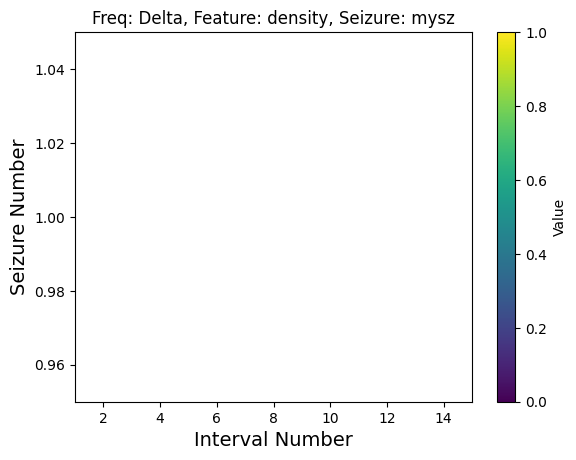

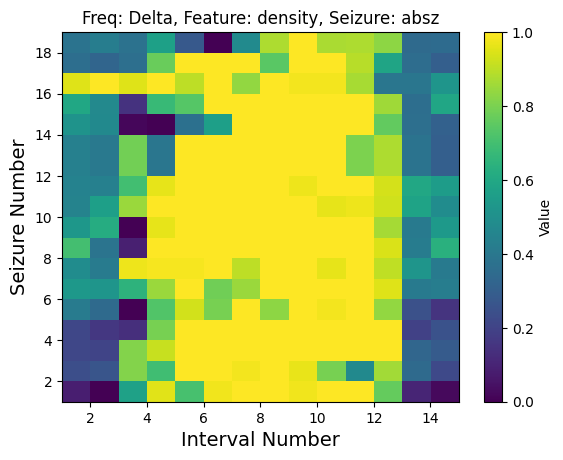

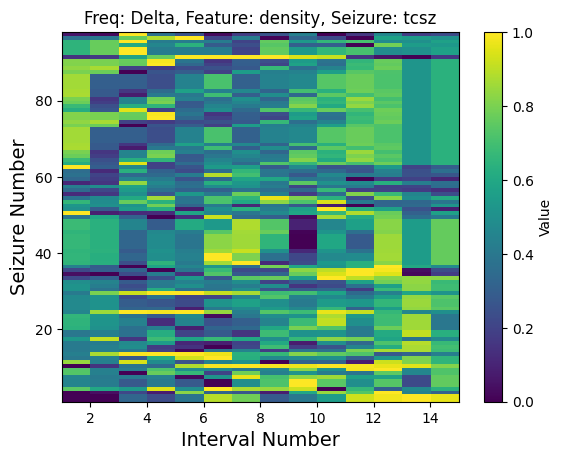

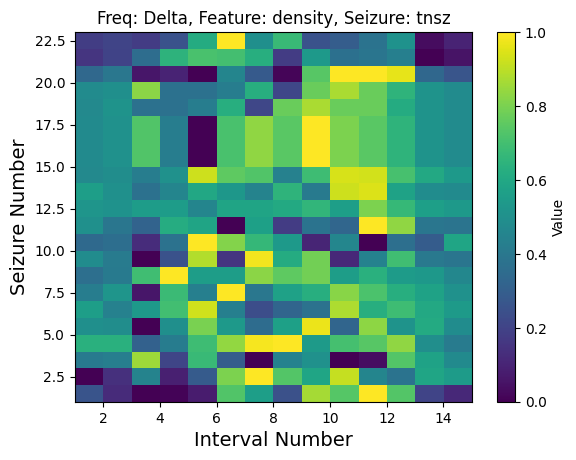

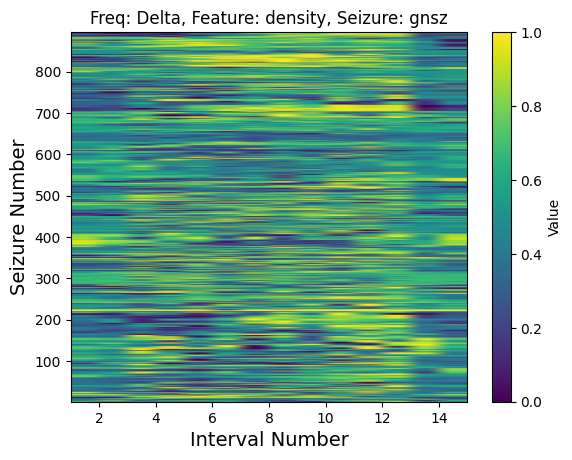

...

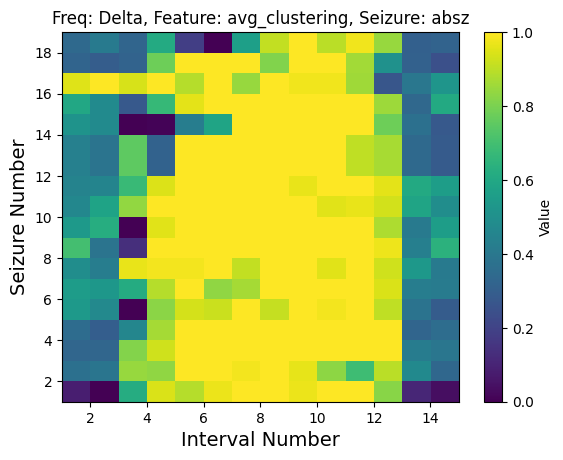

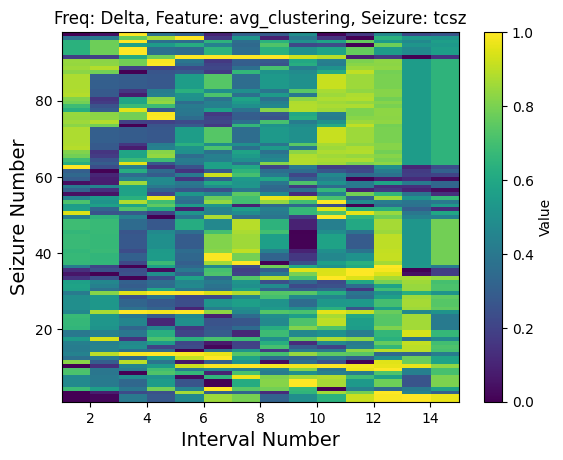

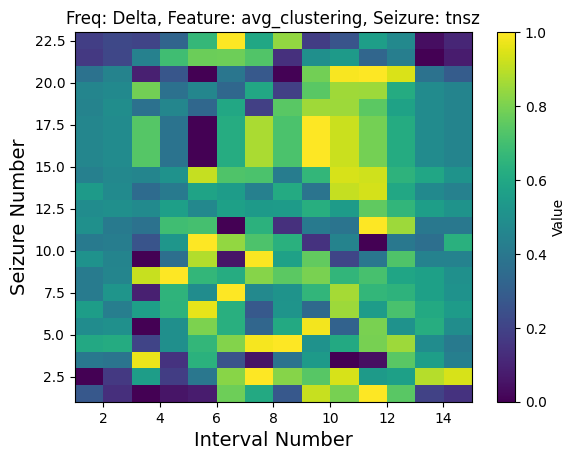

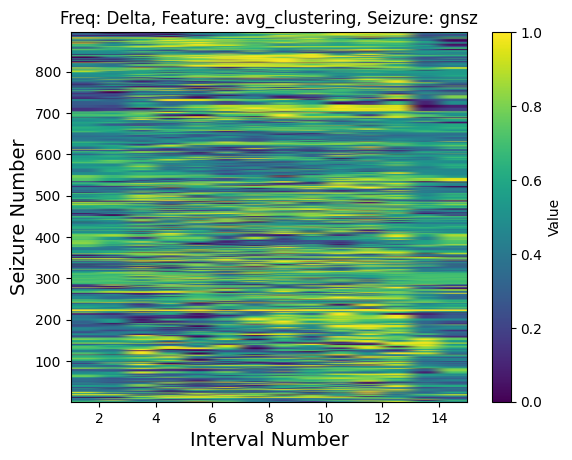

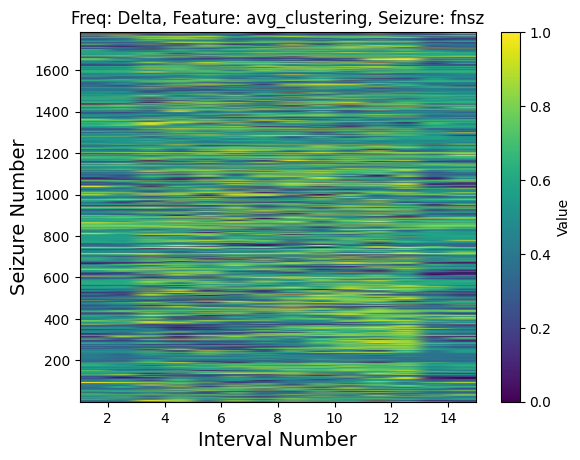

In [ ]:
def get_seizure_types(all_results, recording_names):
    # Retrieve available seizure types across all recordings
    seizure_types = set()
    for recording in recording_names:
        for key in all_results.keys():
            if key[0] == recording:
                seizure_types.add(key[3])  # Add the seizure_type part of the key
    return list(seizure_types)

def plot_matrices_for_frequency_feature(all_results, recording_names, frequency_band, feature):
    # Retrieve available seizure types for these recordings
    seizure_types = get_seizure_types(all_results, recording_names)

    for seizure_type in seizure_types:
        seizure_t = seizure_type[:4]
        # Collect the matrices for each recording and concatenate them vertically
        concatenated_matrix = []
        for recording_name in recording_names:
            key = (recording_name, frequency_band, feature, seizure_type)
            if key in all_results:
                matrix = all_results[key]
                concatenated_matrix.append(matrix)

        if concatenated_matrix:  # Only plot if there are matrices available
            # Concatenate vertically to create a single matrix
            vconcatenated_matrix = np.vstack(concatenated_matrix)
            # Remove rows with NaN
            vconcatenated_matrix_nonan = vconcatenated_matrix[~np.isnan(vconcatenated_matrix).any(axis=1)]
                        
            # Plot the matrix
            plt.imshow(vconcatenated_matrix_nonan, cmap='viridis', aspect='auto', extent=[1, vconcatenated_matrix_nonan.shape[1]+1, 1, vconcatenated_matrix_nonan.shape[0]+1])
            plt.colorbar(label='Value')
            plt.title(f'Freq: {frequency_band}, Feature: {feature}, Seizure: {seizure_t}')
            # plt.xlabel('Column Index')
            # plt.ylabel('Row Index')
            plt.xlabel('Interval Number', fontsize=14)
            plt.ylabel('Seizure Number', fontsize=14)
            plt.show()

# Example usage
freq_bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']  # frequency bands
features = ['density', 'avg_clustering', 'modularity', 'characteristic_path_length']  # features
recording_names= np.unique([key[0] for key in all_results.keys()])

# Loop over each frequency band and feature to generate the plots
for frequency_band in freq_bands:
    for feature in features:
        plot_matrices_for_frequency_feature(all_results, recording_names, frequency_band, feature)

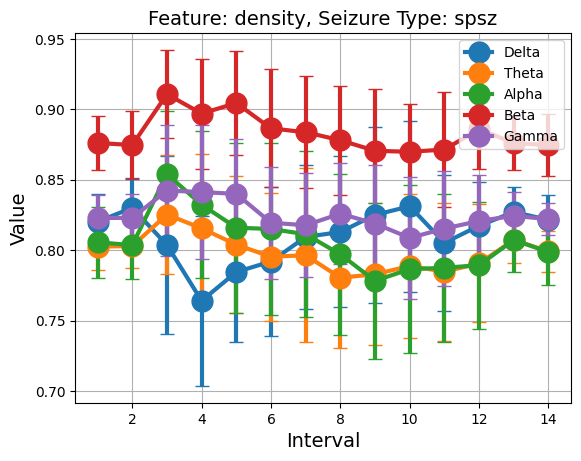

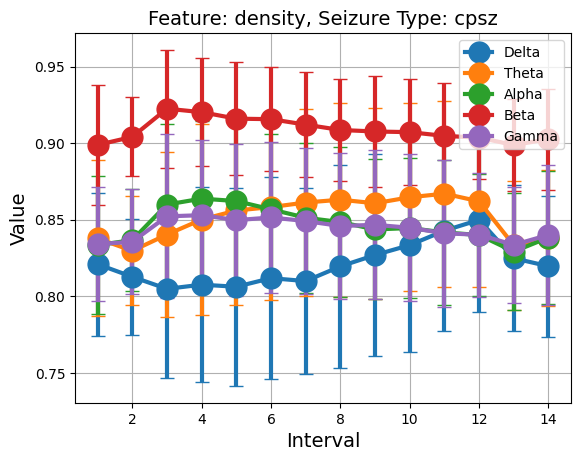

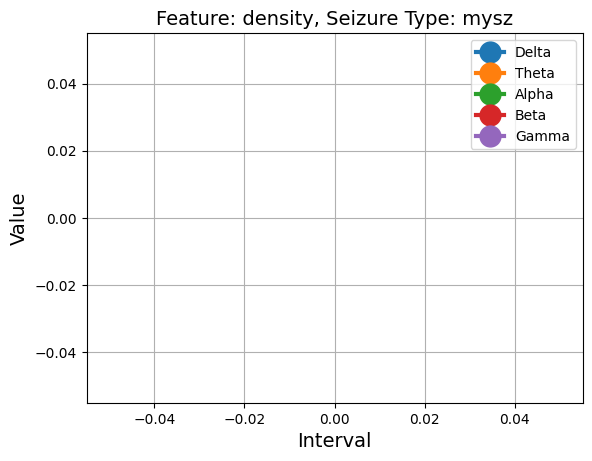

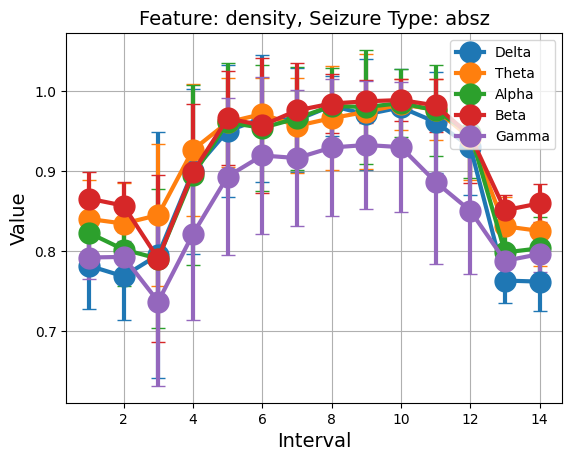

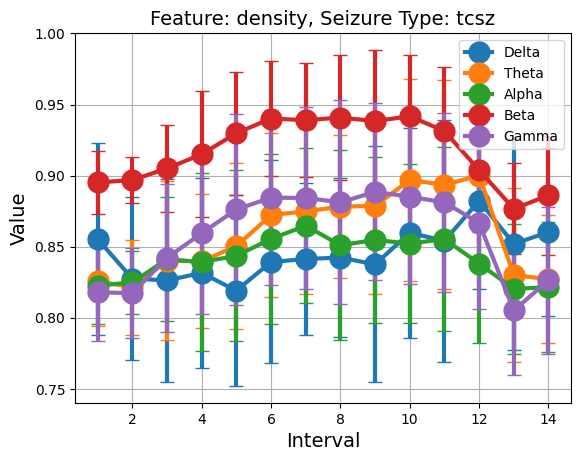

...

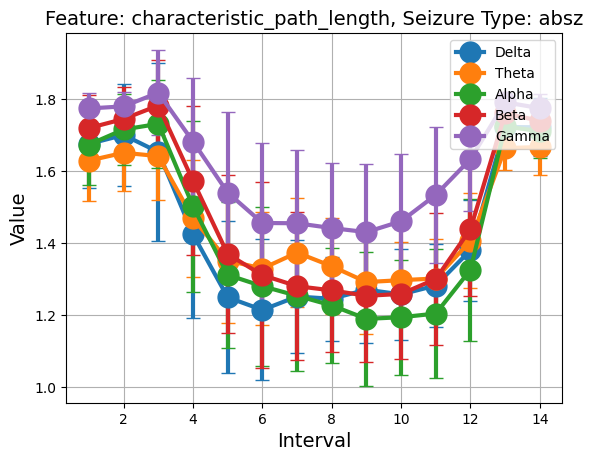

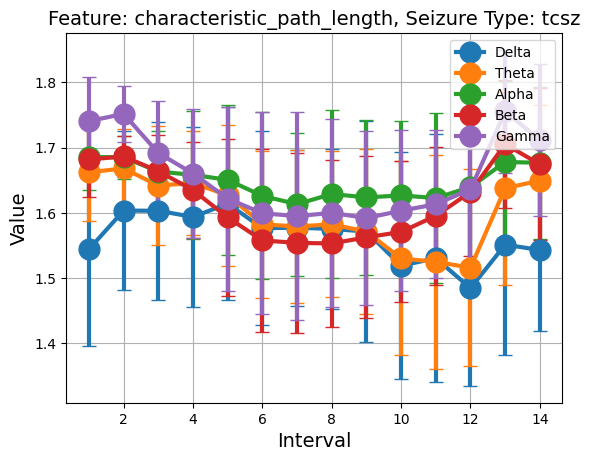

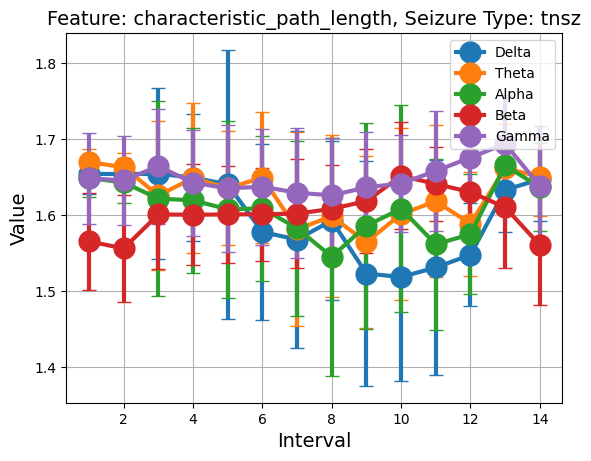

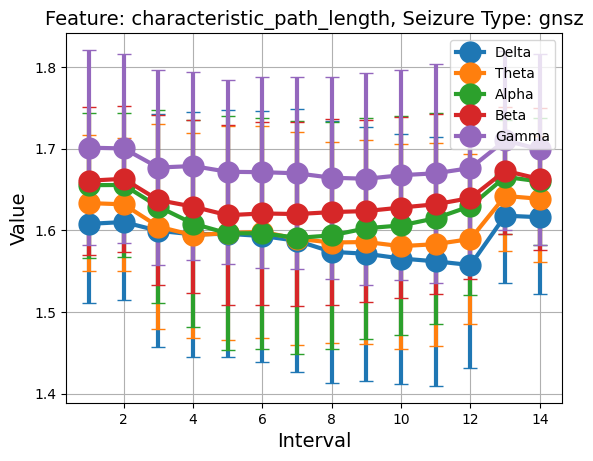

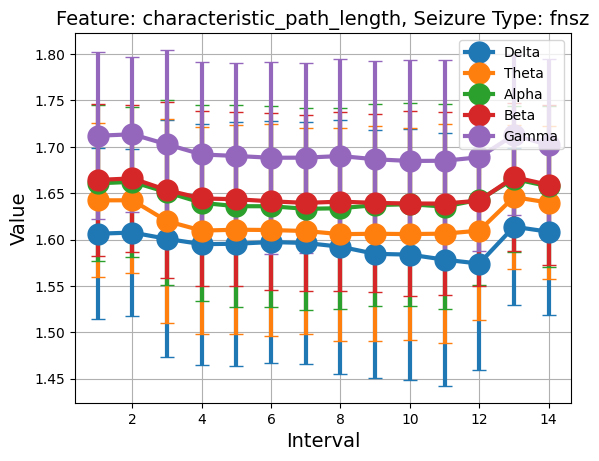

In [ ]:
def get_seizure_types(all_results, recording_names):
    # Retrieve available seizure types across all recordings
    seizure_types = set()
    for recording in recording_names:
        for key in all_results.keys():
            if key[0] == recording:
                seizure_types.add(key[3])  # Add the seizure_type part of the key
    return list(seizure_types)

def plot_charts_for_frequency_feature(all_results, recording_names, frequency_bands, feature):
    # Retrieve available seizure types for these recordings
    seizure_types = get_seizure_types(all_results, recording_names)

    for seizure_type in seizure_types:
        seizure_t = seizure_type[:4]
        # Collect the matrices for each recording and concatenate them vertically        
        for frequency_band in frequency_bands:
            concatenated_matrix = []
            for recording_name in recording_names:
                key = (recording_name, frequency_band, feature, seizure_type)
                if key in all_results:
                    matrix = all_results[key]
                    concatenated_matrix.append(matrix)

            if concatenated_matrix:  # Only plot if there are matrices available
                # Concatenate vertically to create a single matrix
                vconcatenated_matrix = np.vstack(concatenated_matrix)
                # Remove rows with NaN
                vconcatenated_matrix_nonan = vconcatenated_matrix[~np.isnan(vconcatenated_matrix).any(axis=1)]
                means = np.mean(vconcatenated_matrix_nonan, axis = 0)
                stds = np.std(vconcatenated_matrix_nonan, axis = 0)
                sems = stds / np.sqrt(vconcatenated_matrix.shape[0])

                ax = np.arange(len(means)) + 1
                
                # plt.errorbar(ax, means, yerr=stds, 
                #  capsize=5, linewidth=3, linestyle='-', marker='o', markersize=15, 
                #  label='Mean ± Std Dev')
                
                plt.errorbar(ax, means, yerr=sems, 
                capsize=5, linewidth=3, linestyle='-', marker='o', markersize=15, 
                label='Mean ± SEM')
                
                # plt.errorbar(ax, means, yerr=stds, 
                # capsize=5, linewidth=3, linestyle='-', marker='o', markersize=15, 
                # label='Mean ± SEM')
    
        plt.title(f'Feature: {feature}, Seizure Type: {seizure_type[:4]}', fontsize=14)
        plt.xlabel('Interval', fontsize=14)
        plt.ylabel('Value', fontsize=14)
        # plt.legend(frequency_bands)
        plt.legend(frequency_bands, loc='upper right')
        plt.grid(True)
        plt.show()

# Example usage
freq_bands = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']  # frequency bands
# features = ['density', 'avg_clustering', 'modularity', 'characteristic_path_length']  # features
features = ['density', 'avg_clustering', 'characteristic_path_length']  # features
recording_names= np.unique([key[0] for key in all_results.keys()])
# Loop over each frequency band and feature to generate the plots
for feature in features:
    # plot_charts_for_frequency_feature(all_results, recording_names, frequency_bands, feature)
    plot_charts_for_frequency_feature(all_results_nonorm, recording_names, frequency_bands, feature)


In [48]:
seizure_types = get_seizure_types(all_results, recording_names)

In [49]:
seizure_types

['mysz_start_stop_pairs',
 'tnsz_start_stop_pairs',
 'gnsz_start_stop_pairs',
 'tcsz_start_stop_pairs',
 'spsz_start_stop_pairs',
 'absz_start_stop_pairs',
 'fnsz_start_stop_pairs',
 'cpsz_start_stop_pairs']